# **HRA-AMAP: 3D Kidney Registration Error Visualization**

**Author:** Mitanshu Bhoot  

**Description:**  
This notebook visualizes **3D registration errors** by comparing a **source kidney model** to a **reference anatomical kidney model**. It includes:
- **Point cloud visualization (before & after registration)**
- **Heatmap of registration errors**
- **Histogram to analyze error distribution**


### 1. Setup and Imports

We begin by adding the AMAP repository to the Python path and importing the required modules.

In [3]:
import sys
import trimesh
import numpy as np
import seaborn as sns
from copy import deepcopy
from tqdm.auto import tqdm
from sklearn.preprocessing import minmax_scale

# Add the AMAP src folder to sys.path
sys.path.append('/Users/mitanshubhoot/Documents/CNS - Python/hubmap/hra-amap/src')

# Import AMAP modules
from organ import Organ
from pipeline import Pipeline
from steps import normalize_rigid
from utils.conversions import to_array

### 2. Load 3D Kidney Models as Point Clouds

We load the source kidney model (generic) and the reference kidney model (HRA anatomical).

In [4]:
# Load Source and Reference (Target) Organs for Left Kidney
source_kidney = Organ(path='/Users/mitanshubhoot/Documents/CNS - Python/hubmap/hra-amap/data/Kidney/Source/VH_M_Kidney_L.glb')
target_kidney = Organ(path='/Users/mitanshubhoot/Documents/CNS - Python/hubmap/hra-amap/data/Kidney/Reference/3d-vh-m-kidney-l.glb')

### 3. Visualizing Point Cloud (Before Registration)

We convert the 3D kidney models into point clouds for visualization.

In [5]:
# Normalize point clouds (optional)
output = normalize_rigid(
    source=deepcopy(source_kidney.pointcloud), 
    target=deepcopy(target_kidney.pointcloud)
)

# Convert normalized organ models to NumPy arrays
normalized_source_kidney = to_array(output.output['Source'])
normalized_target_kidney = to_array(output.output['Target'])

# Create point cloud objects with colors
source_pc = trimesh.PointCloud(normalized_source_kidney, colors=np.tile(np.array([255, 0, 0, 1]), (len(normalized_source_kidney), 1)))  # Red
target_pc = trimesh.PointCloud(normalized_target_kidney, colors=np.tile(np.array([0, 0, 255, 1]), (len(normalized_target_kidney), 1)))  # Blue

# Create a scene with both kidneys before registration
before_scene = trimesh.Scene([source_pc, target_pc])
before_scene.export('/Users/mitanshubhoot/Documents/CNS - Python/hubmap/hra-amap/Figures/kidney_before_reg.glb')
before_scene.show()

In [6]:
 # Source Kidney
trimesh.Scene([source_pc]).show()

In [7]:
# Target Kidney
trimesh.Scene([target_pc]).show()

### 4. Registering the Point Cloud

We perform rigid and non-rigid registration to align the source kidney model to the target reference kidney model.

In [8]:
# Instantiate the registration pipeline
pipeline = Pipeline(
    name='Kidney Base Registration',
    description='Registering Generic Kidney to HRA Anatomical Kidney',
    params='/Users/mitanshubhoot/Documents/CNS - Python/hubmap/hra-amap/configs/params.yaml'
)

# Run the registration pipeline
print("Running kidney registration...")
projections = pipeline.run(source=source_kidney, target=target_kidney)

print("Registration complete.")

Running kidney registration...
Registration complete.


### 5. Visualizing Point Cloud (After Registration)

We now visualize how the source kidney has been transformed after registration.

In [9]:
# Create point cloud for registered kidney
projected_pc = trimesh.PointCloud(projections.registration.vertices, colors=np.tile(np.array([255, 0, 0, 1]), (len(projections.registration.vertices), 1)))  # Red
target_pc = trimesh.PointCloud(target_kidney.vertices, colors=np.tile(np.array([0, 0, 255, 1]), (len(target_kidney.vertices), 1)))  # Blue

# Create a scene with registered kidneys
after_scene = trimesh.Scene([projected_pc, target_pc])
after_scene.export('/Users/mitanshubhoot/Documents/CNS - Python/hubmap/hra-amap/Figures/kidney_after_reg.glb')
after_scene.show()

In [10]:
# Show only registered kidney
projections.registration.show()

### 6. Generating Heatmap of Registration Errors

We calculate error distances between the registered kidney and the reference kidney, then visualize it as a heatmap.

In [17]:
# Compute signed distance from registered kidney to reference kidney
sd = trimesh.proximity.signed_distance(target_kidney, projections.registration.vertices)

In [29]:
# Rescale error values between -1 and 1 for visualization
sd_scaled = minmax_scale(sd, feature_range=(-1, 1), axis=0, copy=True)

# Create a color map
colors = trimesh.visual.interpolate(sd_scaled, color_map='jet')

# Build a new registered organ mesh with heatmap colors
heatmap = trimesh.Trimesh(
    vertices=np.array(projections.registration.vertices), 
    faces=np.array(projections.registration.faces), 
    vertex_colors=colors
)

# Show the error heatmap
heatmap.export('/Users/mitanshubhoot/Documents/CNS - Python/hubmap/hra-amap/Figures/error_heatmap.glb')
heatmap.show()

### 7. Plotting Error Distribution Histogram

A histogram helps analyze the distribution of registration errors.

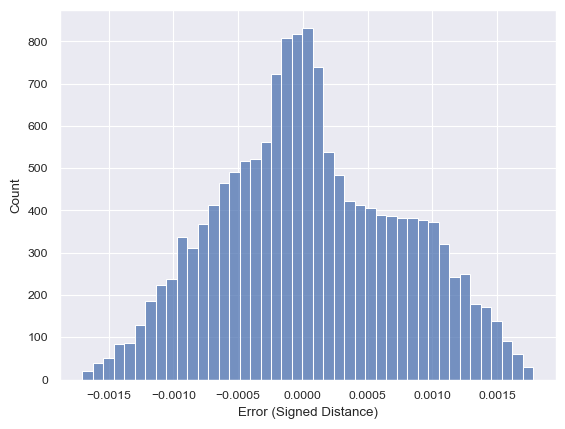

In [31]:
# Set Seaborn visualization style
import matplotlib.pyplot as plt
sns.set_style('darkgrid')
sns.set_theme('paper')

# Create histogram
hist = sns.histplot(data=sd).set_xlabel('Error (Signed Distance)')

# Display the histogram plot
fig = hist.get_figure()
fig.savefig("/Users/mitanshubhoot/Documents/CNS - Python/hubmap/hra-amap/Figures/error_disthistogram.png") 
plt.show()